### Defferential Evolution (eralize rosenbrock)




In [153]:
import numpy as np
import random
from array import *
import matplotlib.pyplot as plt
import statistics as st
import math 

In [154]:
D = 10 # Dimensi dari permasalahan
#maxit = 99 #Max iterasi
maxit = 495 #Max iterasi
ukuranPopulasi = 10
LB = -5.12 #Batas Bawah
UB = 5.12 #Batas Atas
CR = 0.9 
F = 0.5



In [155]:
import random
def initPopulasi(ukuranPopulasi, D, UB, LB): #Inisialisasi setiap baris kolom
    P = np.empty((ukuranPopulasi,D))
    for i in range(ukuranPopulasi):
        for j in range(D):
            P[i][j]= (random.random()*(UB-LB))+LB
    return P

P = initPopulasi(ukuranPopulasi, D, UB, LB)
print(P)

[[-3.2624089  -1.49039916 -3.23395392 -3.45809705  2.79498964 -2.55798858
   2.43109578 -3.84155635  3.38225337 -3.1593795 ]
 [-4.96577034  3.67998815 -3.00965051 -4.14117572  3.37125551 -4.72333636
   2.25790292 -2.40802317 -2.55694828 -4.96389869]
 [-3.74524393 -3.03583626 -2.59040671 -2.92361815 -1.90616482 -1.56325007
   1.65395186 -0.11823577  0.73703835 -1.4717998 ]
 [ 4.450193    3.39059319  4.85541336  1.35805933 -4.79226438 -0.23229507
  -3.00187602 -4.69191832 -4.59975205 -1.38296498]
 [-2.38084244  3.92483052  4.12030404  0.15784405 -3.2262759   3.35222084
  -0.22299671  4.98344965  4.77082471 -1.21258905]
 [-1.13971517 -1.14247076 -3.89817727 -1.92857946  0.48916429 -0.79525553
  -4.18576982  1.35591617  2.48063094  3.50613934]
 [ 3.73048957 -1.57626963  3.5442358   4.3315732   0.58517554 -0.23831071
  -2.79218961 -0.90566567  2.36991679 -0.2613543 ]
 [-3.46049838 -4.78393875  4.95038207 -2.13505006  0.01010492 -4.59807786
   3.39433049  0.18658997 -3.07106186  2.2230482 ]


In [156]:
def Fitness_Func(populasi):
    ukuran = populasi.shape
    ukuranPopulasi = ukuran[0]
    dimensi = ukuran[1]
    
    Fobj = np.empty(ukuranPopulasi)
    
    for i in range (ukuranPopulasi):
        d = 0
        for j in range (dimensi):
            #d = d + populasi[i][j]**2
            #d = d + np.sum(np.abs(populasi[i][j])) + np.product(np.abs(populasi[i][j])) #schwefel 2.22
            #d = d + np.sum(100*(populasi[i][j]+1)-(populasi[i][j]))**2 + (populasi[i][j]-1)**2 #Generalize rosenbrock
            d =  d + np.sum( (populasi[i][j]**2) - (10*math.cos(2*math.pi*populasi[i][j])) + 10 ) #rastrigins
        Fobj[i] = d
    return Fobj
    
Fobj = Fitness_Func(P)
print(Fobj)



[223.32125038 235.41434    150.02347486 256.55879554 183.74504968
 159.86023523 191.55072537 193.91827206 157.79950107 163.23389168]


In [157]:
def crossOver(populasi,F,j):
    ukuran = populasi.shape
    ukuranPopulasi = ukuran[0]
    Dimensi = ukuran[1]
    
    r1 = random.randint(0, ukuranPopulasi-1)
    r2 = random.randint(0, ukuranPopulasi-1)
    r3 = random.randint(0, ukuranPopulasi-1)
    
    while r1 == r2:
        r2 = (r2 + 1)%ukuranPopulasi
        
    while r3 == r1 or r3 == r2:
        r3 = (r3 + 1)%ukuranPopulasi
        
    v = P[r3][j] + F*(P[r1][j] - P[r2][j])
    return v

v = crossOver(P,F,1)
print(v)

-1.7304989087099352


In [158]:
P = initPopulasi(ukuranPopulasi, D, UB, LB)
print("Inisialisasi Populasi :\n",P)
print(P)

Fobj = Fitness_Func(P)
print(Fobj)
print("\nFungsi Objective :\n",Fobj)

U = np.empty((1,D))
bestFobj = np.empty((maxit+1))
bestFobj[0] = Fobj.min()

for it in range(maxit):
    for i in range(ukuranPopulasi):
        for j in range(D):
            U[0][j] = P[i][j]

        jrand=random.randint(0,D)
        
        for j in range(D):
            if random.random() < CR or j == jrand:
                v = crossOver(P,F,j)
                U[0][j] = v
                
        FobjU = Fitness_Func(U)
        
        if FobjU < Fobj[i]:
            Fobj[i] = FobjU
            for j in range(D):
                P[i][j] = U[0][j]
                
    bestFobj[it+1] = Fobj.min()

    print("\nNilai Optimal : \n",bestFobj)

    for i in range(30):
        bestFobj

Streaming output truncated to the last 5000 lines.
  3.97758475e+001  3.97758475e+001  3.97758475e+001  3.97758475e+001
  3.97758475e+001  3.97758475e+001  3.97758475e+001  3.97758475e+001
  3.97758475e+001  3.97758475e+001  3.97758475e+001  3.97758475e+001
  3.97758475e+001  3.97758475e+001  3.97758475e+001  3.97758475e+001
  3.97758475e+001  3.97758475e+001  3.97758475e+001  3.97758475e+001
  3.97590868e+001  3.97590868e+001  3.97590868e+001  3.97590868e+001
  3.97590868e+001  3.97590868e+001  3.97590868e+001  3.97590868e+001
  3.97590868e+001  3.97590868e+001  3.97590868e+001  3.97590868e+001
  3.09782269e+001  3.09782269e+001  3.09782269e+001  3.09782269e+001
  3.09782269e+001  3.09782269e+001  3.09782269e+001  3.09782269e+001
  3.09782269e+001  3.09782269e+001  3.09782269e+001  3.09782269e+001
  3.09782269e+001  3.09782269e+001  3.09782269e+001  3.09782269e+001
  3.09782269e+001  3.09782269e+001  3.09782269e+001  3.09782269e+001
  3.09782269e+001  3.09782269e+001  3.09782269e+001 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [159]:
import statistics as st
print("Nilai Mean : ",st.mean(bestFobj))
print("Nilai Standard Deviation : ",st.stdev(bestFobj))
print("Nilai Minimal : ",np.min(bestFobj))

Nilai Mean :  39.66523750432544
Nilai Standard Deviation :  25.229802589630165
Nilai Minimal :  19.470490042715884


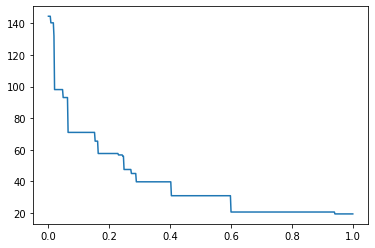

In [160]:
x = np.linspace(0, 1, maxit+1)
plt.plot(x, bestFobj, label= 'f=Fobj')
plt.show()

### Genetic Algorithm

In [161]:
import numpy as np
import random
from array import *
import matplotlib.pyplot as plt
import statistics as st
import math 

In [162]:
N = 3
rows, cols = (N, 4)
induk = [[0 for i in range(cols)] for j in range(rows)]
print (induk)

N_Anak = 6
rows, cols = (N_Anak, 4)
anak = [[0 for i in range(cols)] for j in range(rows)]
print(anak)


[[0, 0, 0, 0], [0, 0, 0, 0], [0, 0, 0, 0]]
[[0, 0, 0, 0], [0, 0, 0, 0], [0, 0, 0, 0], [0, 0, 0, 0], [0, 0, 0, 0], [0, 0, 0, 0]]


In [163]:
#Inisialiasi Parameter
Pc = 0.9
Pm = 0.1

for i in range(N):
    a = random.randint(0, 15)
    induk[i] = [int (x) for x in '{:04b}'.format(a)]
    print(a, induk[i])


10 [1, 0, 1, 0]
7 [0, 1, 1, 1]
9 [1, 0, 0, 1]


In [164]:
#Function cross over
def crossover(ind1=[], ind2=[]):
    anak1 = [0, 0, 0, 0]
    anak2 = [0, 0, 0, 0]
    
    
    anak1[0] = ind1[0]
    anak1[1] = ind1[1]
    anak1[2] = ind2[2]
    anak1[3] = ind2[3]
    
    anak2[0] = ind2[0]
    anak2[1] = ind2[1]
    anak2[2] = ind1[2]
    anak2[3] = ind1[3]
    
    return anak1, anak2


In [165]:
#Function  mutasi
def mutasi(ind=[]):
    ind[1] = 1 - ind[1]
    return ind


In [166]:
#Function hitung Int
def hitungInt(ind = []):
    a = ind[3] * 1
    a = a + ind[2] * 2
    a = a + ind[1] * 4
    a = a + ind[0] * 8
    return a


In [167]:
#Buat function untuk melakukan hitung fitness
def hitungFitness(ind = []):
    a = hitungInt(ind)
    #y = a**2 #sphere
    #y = np.sum(np.abs(a)) + np.product(np.abs(a)) #schwefel 2.22
    #y = np.sum(100*(a+1)-(a))**2 + (a-1)**2 #Generalize rosenbrock
    y = np.sum( (a**2) - (10*math.cos(2*math.pi*a)) + 10 ) #rastrigins

    return y

In [168]:
i = 1
epochs = 495
#epochs = 99
MaxFitness = [0 for i in range(epochs)] 
angkaFitness = [0 for i in range(epochs)]

#nilai fitness induk
for j in range(N):
    if (hitungFitness(induk[j])>MaxFitness[0]):
        MaxFitness[0] = hitungFitness(induk[j])


In [169]:
#'epochs' kali
for i in range(30):
  while i < epochs:
    print("Iterasi: ", i+1)   
    #Reproduksi 
    a = random.random()
    if (a<Pc):
        #Cross over
        anak[0], anak[1] = crossover(induk[0], induk[1])
        anak[2], anak[3] = crossover(induk[0], induk[2])
        anak[4], anak[5] = crossover(induk[1], induk[2])
    else:
        #Mutasi
        for j in range(N):
            induk [j] = mutasi(induk[j])
    #Elistism
    minFitness = 5.12
    idx = 0
    idxanak = 0
    #minFitness (induk terburuk)
    for j in range(len(induk)):
        if (hitungFitness(induk[j])<minFitness):
            minFitness = hitungFitness(induk[j])
            idx = j
    
    #cari maxFit (Anak terbaik)
    maxFit = -5.12
    for j in range(len(anak)):
        if (hitungFitness(anak[j])>maxFit):
            maxFit = hitungFitness(anak[j])
            idxanak = j
    #Individual replacement
    if (minFitness < maxFit):
        induk[idx] = anak[idxanak]
    
    #Populasi induk yang paling baik
    for j in range(N):
        if (hitungFitness(induk[j])>MaxFitness[i]):
            MaxFitness[i] = hitungFitness(induk[j])
    i+=1
    
    print(MaxFitness)

Iterasi:  1
[121.0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



77
[121.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 22

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[121.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



176
[121.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 2

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



404
[121.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 2

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Iterasi:  170
[121.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[121.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Iterasi:  296
[121.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 477
[121.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 225.0, 

In [170]:
print("Nilai Mean : ", st.mean(MaxFitness))
print("Nilai Standard Deviation : ", st.stdev(MaxFitness))
print("Nilai Minimal : ",np.min(MaxFitness))

Nilai Mean :  224.789898989899
Nilai Standard Deviation :  4.674452379745145
Nilai Minimal :  121.0


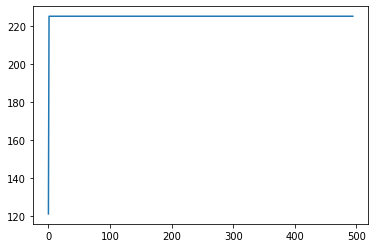

In [171]:
x = [i for i in range(epochs)] 
plt.plot(x, MaxFitness)  